# **File ipynb for classification**

**11/08/2023** -  Progetto Hand Robot Team EEG - Andrea Scarpellini, Sara Paratico
(if you are modifying this file please write here your name)

This file contains a supervised classification analysis on data collected in 2022. We utilized labeled data collected by Davide and applied various algorithms for the supervised classification.


### **JSON FILES:**
We have 22 file called in the following way.
 - POW000.json

  ...

 - POW021.json

####**Description**
- "000": An identifier for a reading session.
- "UserID": User identifier, in this case, "M28".
- "Readings": Contains the reading data collected during the session.
- "000000": A key for a specific reading during the session.
- "Phase": The phase of the recording
  - Baseline 000
  - Baseline Occhi Chiusi
  - Sudoku
  - SPIEGARE LE ALTRE
-"Time": The timestamp of the reading, for example, "12:43:49".
-"AF3", "T7", "Pz", "T8", "AF4": Electrode positions on the scalp.
-"Theta", "Alpha", "BetaL", "BetaH", "Gamma": Power for brain waves in their respective frequency bands.


### **What we use**
We use only the data relative to the channels and the label relative to the phase. With those data we should be able to create a model that can desciminate the phases thanks to the values of pow.


- What are the phases that we are interested  in? --> why?
- How much file we should use for training ?
- for testing?
- for validation?



### **Sub-Objective:**
Can we distinguish between different phases?

Questions:

- Which electrodes carry the most significant weight in the data?

- Why are these electrodes crucial?
- What frequency bands exhibit the greatest influence in the dataset?

- Why are these frequency bands noteworthy?
- Which task is most effective in eliciting concentration from the subject?

- Why is this particular task considered optimal?
- Considering a potential user experience, which analyzed task is the most    suitable choice for triggering the robotic arm?
Explanation: What specific action does the subject need to perform to activate the robotic arm, based on our analysis?






---
# ***SETTINGS***
---

In [82]:
# SARA: montiamo a drive per collegarci alla cartella desiderata
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [83]:
# IMPORT LIBRARIES
import json
import os
import pandas as pd
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
import math
from re import X
import tensorflow as tf
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.layers import Flatten, GlobalAveragePooling2D, Multiply, Reshape, Dense
from tensorflow.keras.layers import UpSampling2D, Conv2D
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

tfk = tf.keras
tfkl = tf.keras.layers

import random
import numpy as np
seed = 4

random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

**WARNING**

(Andrea) --> If you want to use this file you have to change the directory! ( this is another reason we should use github)

Da un file Json otteniamo un dataset pandas. \

Ho pensato che fosse piu' comodo utilizzare un dataset pandas piuttosto che direttamente un file json.

---
# ***DATAFRAME CREATION***
---

In [84]:
 # LOCAL DIR
 # Get the current directory (where your Python script is located)
current_directory = os.path.dirname('ML_POW_')

In [85]:
# I CREATE A LIST OD SINGLE DATAFRAMES AND THEN I CONCATENATE ALL OF THEM FOR MY FUTURE CLASSIFICATION TASK
dfs_list = []
lenght =  []

# Iterate through all the JSON files in the specified range
for i in range(0, 21):
    # Generate the file name (assuming the format is POWxxx.json)
    json_file_name = f'POW{i:03d}.json'
    json_file_path = os.path.join('/content/gdrive/MyDrive/SAPIENS/DB_Macchinine', json_file_name)

    # Check if the file exists before attempting to read it
    if os.path.exists(json_file_path):
        with open(json_file_path, 'r') as json_file:
            data = json.load(json_file)

        rows = []
        # Iterate through the JSON data
        for key, value in data.items():
            user_id = value['UserID']
            readings = value['Readings']
            for reading_key, reading_value in readings.items():
                phase = reading_value['Phase']
                if phase in  ["sudoku", "Sudoku", "Baseline occhi chiusi", "occhi chiusi", "baseline occhi chiusi"]:
                    time = reading_value['Time']
                    af3_theta = reading_value['AF3']['Theta']
                    af3_alpha = reading_value['AF3']['Alpha']
                    af3_betaL = reading_value['AF3']['BetaL']
                    af3_betaH = reading_value['AF3']['BetaH']
                    af3_gamma = reading_value['AF3']['Gamma']

                    t7_theta = reading_value['T7']['Theta']
                    t7_alpha = reading_value['T7']['Alpha']
                    t7_betaL = reading_value['T7']['BetaL']
                    t7_betaH = reading_value['T7']['BetaH']
                    t7_gamma = reading_value['T7']['Gamma']

                    pz_theta = reading_value['Pz']['Theta']
                    pz_alpha = reading_value['Pz']['Alpha']
                    pz_betaL = reading_value['Pz']['BetaL']
                    pz_betaH = reading_value['Pz']['BetaH']
                    pz_gamma = reading_value['Pz']['Gamma']

                    t8_theta = reading_value['T8']['Theta']
                    t8_alpha = reading_value['T8']['Alpha']
                    t8_betaL = reading_value['T8']['BetaL']
                    t8_betaH = reading_value['T8']['BetaH']
                    t8_gamma = reading_value['T8']['Gamma']

                    af4_theta = reading_value['AF4']['Theta']
                    af4_alpha = reading_value['AF4']['Alpha']
                    af4_betaL = reading_value['AF4']['BetaL']
                    af4_betaH = reading_value['AF4']['BetaH']
                    af4_gamma = reading_value['AF4']['Gamma']


                    row = [user_id, phase, time, af3_theta, af3_alpha, af3_betaL, af3_betaH, af3_gamma, t7_theta, t7_alpha, t7_betaL, t7_betaH, t7_gamma,
                           pz_theta, pz_alpha, pz_betaL, pz_betaH, pz_gamma, t8_theta, t8_alpha, t8_betaL, t8_betaH, t8_gamma,
                           af4_theta, af4_alpha, af4_betaL, af4_betaH, af4_gamma]

                    rows.append(row)

    # Define columns as before
    columns = ['UserID', 'Phase', 'Time', 'AF3_Theta', 'AF3_Alpha', 'AF3_BetaL', 'AF3_BetaH', 'AF3_Gamma',
           'T7_Theta', 'T7_Alpha', 'T7_BetaL', 'T7_BetaH', 'T7_Gamma',
           'Pz_Theta', 'Pz_Alpha', 'Pz_BetaL', 'Pz_BetaH', 'Pz_Gamma',
           'T8_Theta', 'T8_Alpha', 'T8_BetaL', 'T8_BetaH', 'T8_Gamma',
           'AF4_Theta', 'AF4_Alpha', 'AF4_BetaL', 'AF4_BetaH', 'AF4_Gamma']

    # Create a DataFrame from the rows and columns
    df = pd.DataFrame(rows, columns=columns)

    # Filter the DataFrame to only include rows with 'Phase' as "sudoku" or "baseline occhi chiusi"
    filtered_df = df[df['Phase'].isin(["sudoku", "Sudoku", "Baseline occhi chiusi", "occhi chiusi", "baseline occhi chiusi"])]

    # I do not need UserID and Time
    columns_to_remove = ['UserID', 'Time']
    filtered_df.drop(columns=columns_to_remove, inplace=True)
    lenght.append(len(filtered_df))

    # LIST OF ALL DATAFRAMES
    dfs_list.append(filtered_df)

# FINAL COLLECTIVE DATAFRAME
df_final = pd.concat(dfs_list, ignore_index=True)

print(df_final.shape)
df_final.head()

(60146, 26)


,Phase,AF3_Theta,AF3_Alpha,AF3_BetaL,AF3_BetaH,AF3_Gamma,T7_Theta,T7_Alpha,T7_BetaL,T7_BetaH,...,T8_Theta,T8_Alpha,T8_BetaL,T8_BetaH,T8_Gamma,AF4_Theta,AF4_Alpha,AF4_BetaL,AF4_BetaH,AF4_Gamma
0,baseline occhi chiusi,2.514,4.049,6.891,3.734,2.143,3.878,3.109,4.454,3.1,...,3.368,9.275,10.638,3.768,3.033,3.03,5.133,6.916,4.916,2.152
1,baseline occhi chiusi,2.184,3.739,5.57,3.868,2.017,3.327,3.66,4.823,3.116,...,3.754,10.035,10.933,3.293,2.756,2.583,4.833,5.746,5.199,2.108
2,baseline occhi chiusi,2.03,3.471,4.345,3.931,1.849,2.814,4.142,5.099,3.022,...,4.156,10.042,10.698,2.928,2.48,2.429,4.343,4.658,5.4,2.024
3,baseline occhi chiusi,2.059,3.598,3.408,3.924,1.706,2.552,4.518,5.164,2.871,...,4.449,9.434,9.763,2.688,2.236,2.457,4.088,3.804,5.43,1.931
4,baseline occhi chiusi,2.361,4.377,2.791,3.916,1.643,2.659,4.794,4.94,2.771,...,4.548,8.518,8.255,2.589,2.066,2.977,4.451,3.207,5.29,1.858


### **Dataset Exploration**

- Balance
- Missing values
- Variable types
- Variable distributions
- Potential variable transformations
- Variable distributions separated by phase
- Possible correlation between channels

---
# ***COUNTPLOT***
---

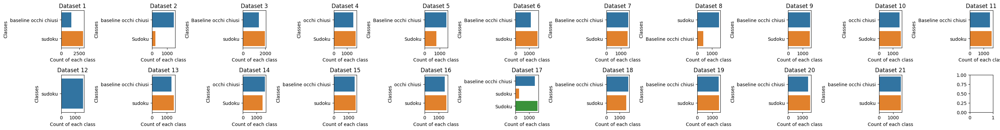

In [86]:
# Creare la griglia di subplots
fig, axes = plt.subplots(nrows=2, ncols=11, figsize=(30, 4))

# Iterare attraverso la lista di DataFrame e disegnare i countplot su ogni subplot
for i, df in enumerate(dfs_list):
    row = i // 11  # Calcola la riga del subplot
    col = i % 11   # Calcola la colonna del subplot

    sns.countplot(y=df['Phase'], data=df, ax=axes[row, col])
    axes[row, col].set_xlabel("Count of each class")
    axes[row, col].set_ylabel("Classes")
    axes[row, col].set_title(f'Dataset {i+1}')

# Aggiusta il layout in modo che i titoli non si sovrappongano
plt.tight_layout()

# Mostra il grafico
plt.show()

The dataset is  not balanced ! Considering boostrapping or elimination of data or something else (ask to a data analyst what  we should do)

**--> SARA**: possible options could be balance classes in classification net, there's a specific key for balances

---
# ***MISSING VALUES CHECK***
---

In [87]:
# MISSING VALUES CHECK
df_final.isna().any()

Phase        False
AF3_Theta    False
AF3_Alpha    False
AF3_BetaL    False
AF3_BetaH    False
AF3_Gamma    False
T7_Theta     False
T7_Alpha     False
T7_BetaL     False
T7_BetaH     False
T7_Gamma     False
Pz_Theta     False
Pz_Alpha     False
Pz_BetaL     False
Pz_BetaH     False
Pz_Gamma     False
T8_Theta     False
T8_Alpha     False
T8_BetaL     False
T8_BetaH     False
T8_Gamma     False
AF4_Theta    False
AF4_Alpha    False
AF4_BetaL    False
AF4_BetaH    False
AF4_Gamma    False
dtype: bool

---
# ***DATA DTYPE***
---

In [88]:
print(df_final.dtypes)

Phase        object
AF3_Theta    object
AF3_Alpha    object
AF3_BetaL    object
AF3_BetaH    object
AF3_Gamma    object
T7_Theta     object
T7_Alpha     object
T7_BetaL     object
T7_BetaH     object
T7_Gamma     object
Pz_Theta     object
Pz_Alpha     object
Pz_BetaL     object
Pz_BetaH     object
Pz_Gamma     object
T8_Theta     object
T8_Alpha     object
T8_BetaL     object
T8_BetaH     object
T8_Gamma     object
AF4_Theta    object
AF4_Alpha    object
AF4_BetaL    object
AF4_BetaH    object
AF4_Gamma    object
dtype: object


We should chage from object to float the POW numbers.

In [89]:
# Use the astype method to convert columns to float
columns_to_convert = [
    'AF3_Theta', 'AF3_Alpha', 'AF3_BetaL', 'AF3_BetaH', 'AF3_Gamma',
    'T7_Theta', 'T7_Alpha', 'T7_BetaL', 'T7_BetaH', 'T7_Gamma',
    'Pz_Theta', 'Pz_Alpha', 'Pz_BetaL', 'Pz_BetaH', 'Pz_Gamma',
    'T8_Theta', 'T8_Alpha', 'T8_BetaL', 'T8_BetaH', 'T8_Gamma',
    'AF4_Theta', 'AF4_Alpha', 'AF4_BetaL', 'AF4_BetaH', 'AF4_Gamma'
]

# total df
df_final[columns_to_convert] = df_final[columns_to_convert].astype(float)

# all dfs
for i in dfs_list:
  i[columns_to_convert] = i[columns_to_convert].astype(float)

In [90]:
print(df_final.dtypes)

Phase         object
AF3_Theta    float64
AF3_Alpha    float64
AF3_BetaL    float64
AF3_BetaH    float64
AF3_Gamma    float64
T7_Theta     float64
T7_Alpha     float64
T7_BetaL     float64
T7_BetaH     float64
T7_Gamma     float64
Pz_Theta     float64
Pz_Alpha     float64
Pz_BetaL     float64
Pz_BetaH     float64
Pz_Gamma     float64
T8_Theta     float64
T8_Alpha     float64
T8_BetaL     float64
T8_BetaH     float64
T8_Gamma     float64
AF4_Theta    float64
AF4_Alpha    float64
AF4_BetaL    float64
AF4_BetaH    float64
AF4_Gamma    float64
dtype: object


---
# ***DATA DISTRIBUTION***
---

FILE  0


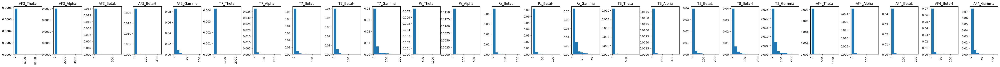

FILE  1


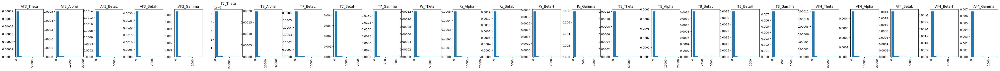

FILE  2


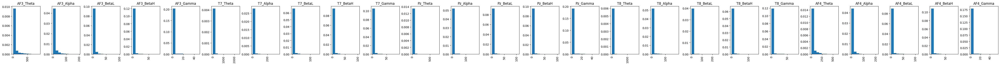

FILE  3


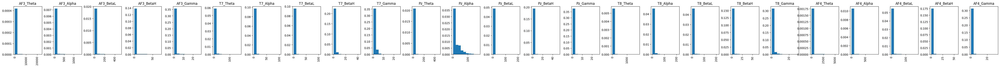

FILE  4


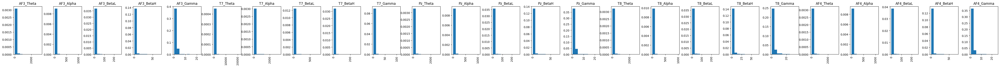

FILE  5


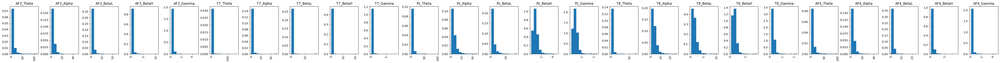

FILE  6


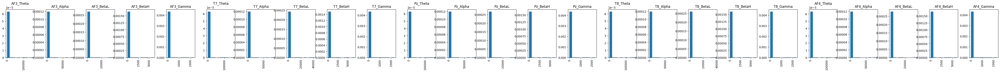

FILE  7


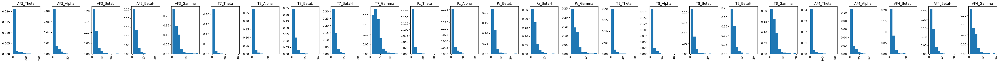

FILE  8


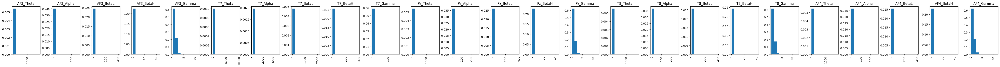

FILE  9


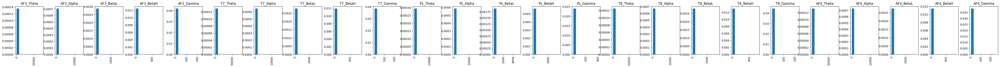

FILE  10


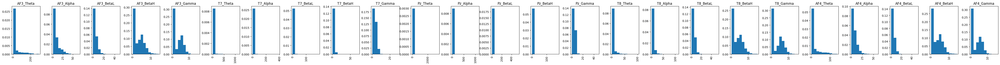

FILE  11


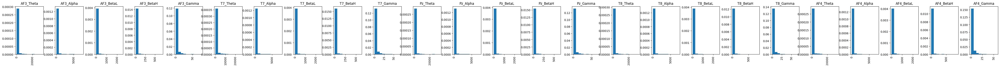

FILE  12


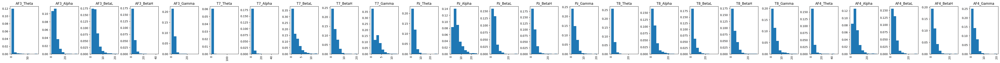

FILE  13


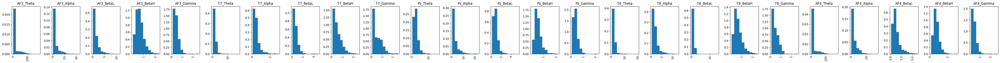

FILE  14


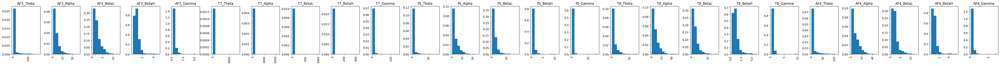

FILE  15


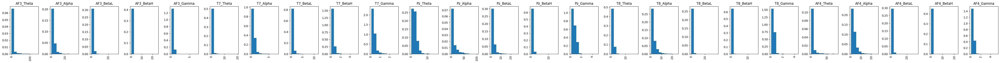

FILE  16


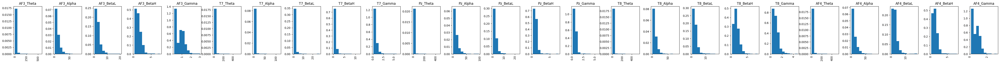

FILE  17


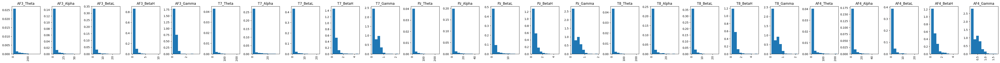

FILE  18


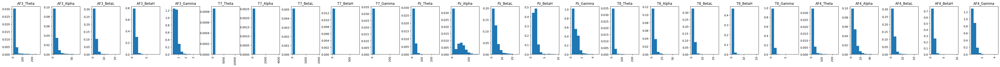

FILE  19


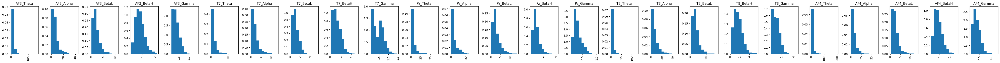

FILE  20


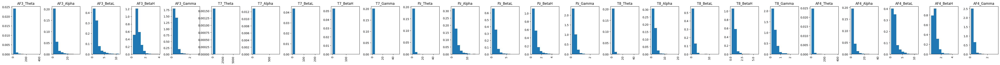

In [91]:
#n = index od dfs_list
n = 0
for i in dfs_list:
  pow = i[columns_to_convert]

  fig, axes = plt.subplots(1, 25,figsize=[50,3])
  axes = axes.flatten()
  fig.tight_layout(h_pad=10)
  print("\033[1mFILE\033[0m ", f'{n}')
  k=0
  for x in pow.columns:
    plt.sca(axes[k]) # set the current Axes
    plt.hist(pow[x],density=True)
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
    plt.title(x)
    k+=1
  n+=1

  plt.show()

We would like the data to be as distributed and normal as possible. Since these data points are concentrated around zero and exhibit exponential decay, we apply a logarithm to make them more "normal."

In [92]:
transformed_list = []
for i in dfs_list:
  transformed = i[columns_to_convert].apply(lambda x: x.apply(lambda y: math.log(y + 1)))
  transformed_list.append(transformed)

final_transformed = pd.concat(transformed_list, ignore_index=True)

FILE  0


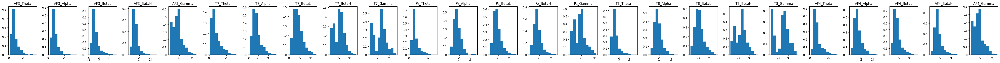

FILE  1


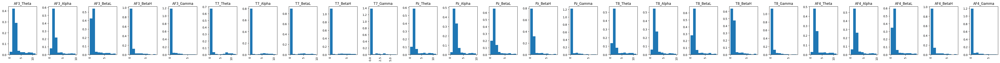

FILE  2


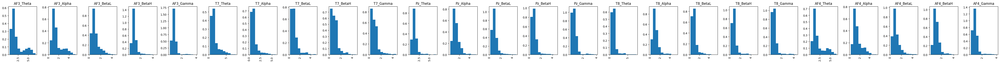

FILE  3


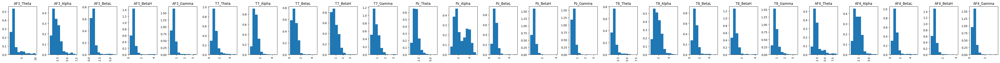

FILE  4


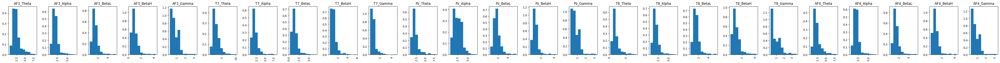

FILE  5


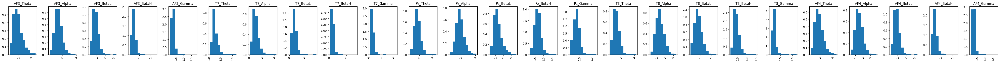

FILE  6


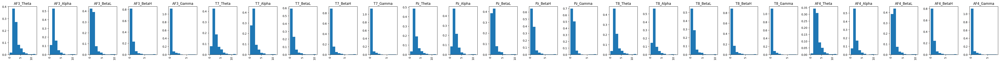

FILE  7


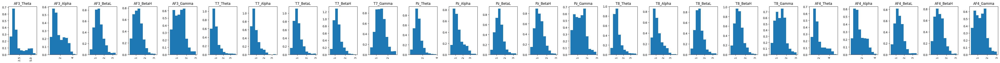

FILE  8


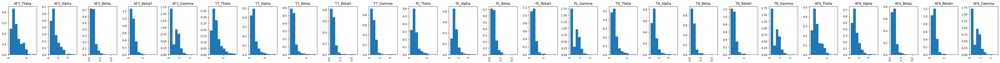

FILE  9


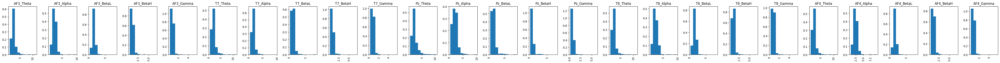

FILE  10


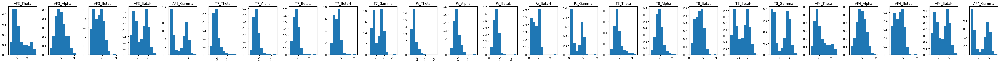

FILE  11


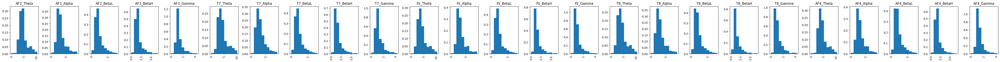

FILE  12


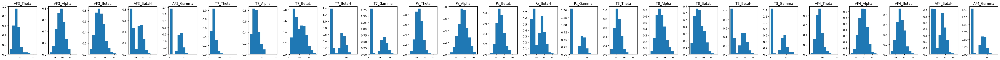

FILE  13


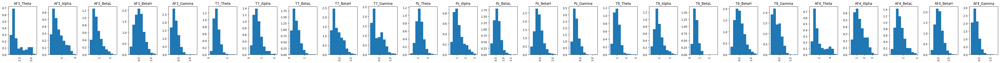

FILE  14


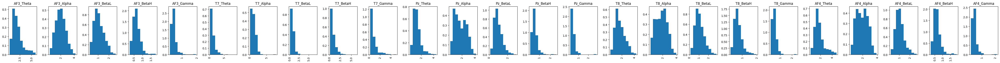

FILE  15


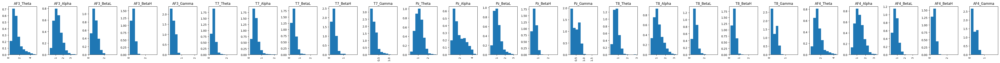

FILE  16


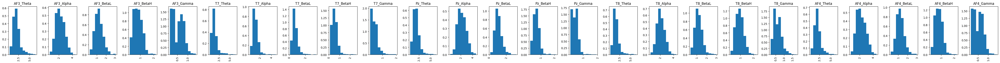

FILE  17


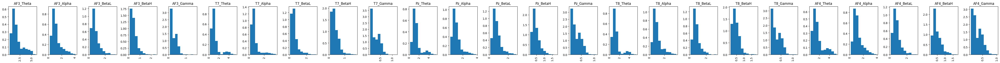

FILE  18


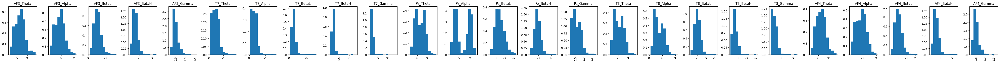

FILE  19


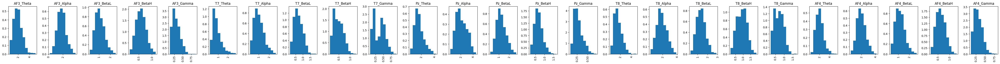

FILE  20


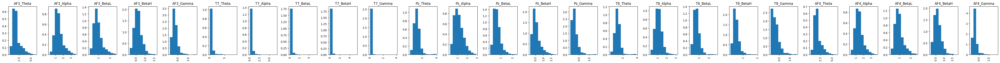

In [93]:
#n = index od dfs_list
n = 0
for i in transformed_list:
  pow = i[columns_to_convert]

  fig, axes = plt.subplots(1, 25,figsize=[50,3])
  axes = axes.flatten()
  fig.tight_layout(h_pad=10)
  print("\033[1mFILE\033[0m ", f'{n}')
  k=0
  for x in pow.columns:
    plt.sca(axes[k]) # set the current Axes
    plt.hist(pow[x],density=True)
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
    plt.title(x)
    k+=1
  n+=1

  plt.show()

---
# ***RELAX AND FOCUS IN DATA***
---

FILE  0


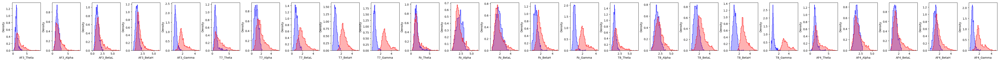

FILE  1


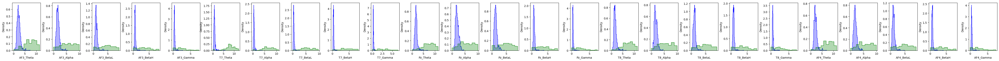

FILE  2


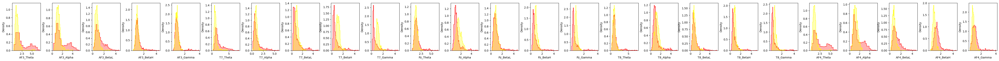

FILE  3


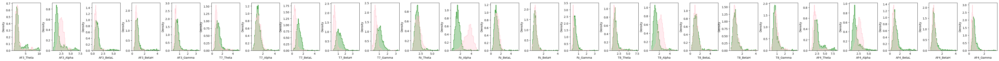

FILE  4


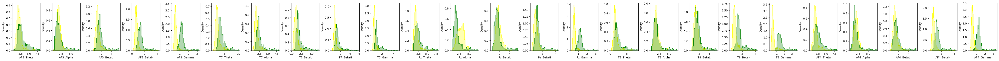

FILE  5


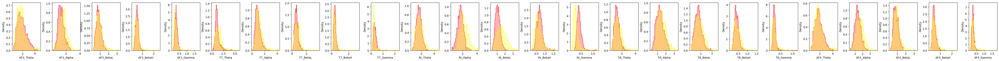

FILE  6


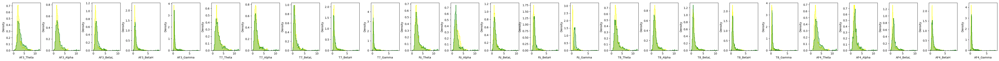

FILE  7


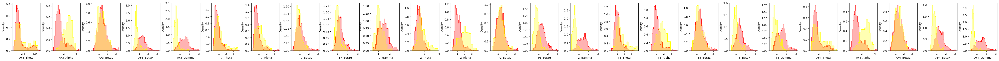

FILE  8


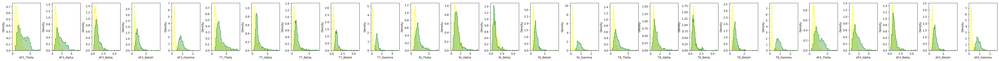

FILE  9


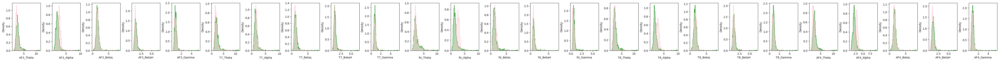

FILE  10


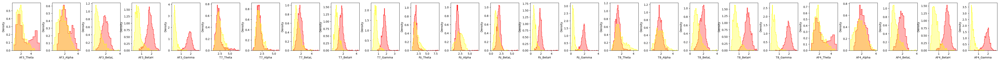

FILE  11


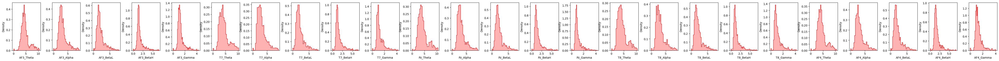

FILE  12


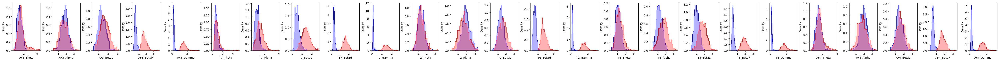

FILE  13


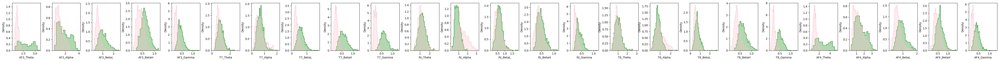

FILE  14


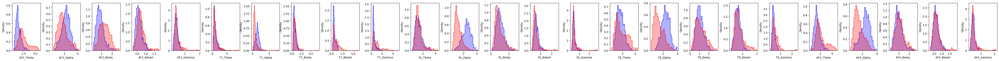

FILE  15


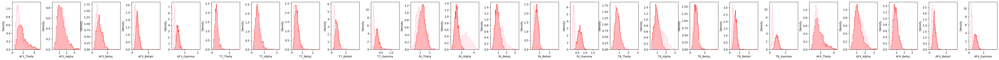

FILE  16


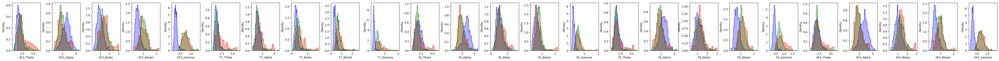

FILE  17


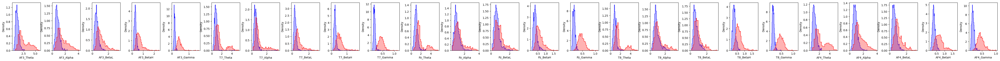

FILE  18


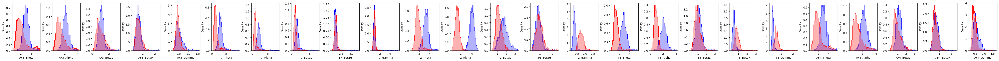

FILE  19


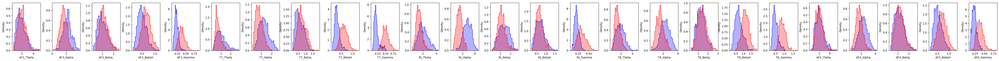

FILE  20


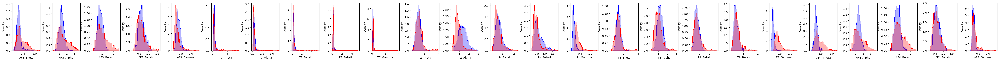

In [94]:
n = 0
for i, df in enumerate(transformed_list):
  data = dfs_list[i]
  X0 = df[data['Phase']=='baseline occhi chiusi']
  X1 = df[data['Phase']=='sudoku']
  X2 = df[data['Phase']=='Baseline occhi chiusi']
  X3 = df[data['Phase']=='Sudoku']
  X4 = df[data['Phase']=='occhi chiusi']

  fig, axes = plt.subplots(ncols=25, nrows=1, figsize=(50,3))
  fig.tight_layout()

  print("\033[1mFILE\033[0m ", f'{n}')
  for i, ax in zip(range(df.columns.size), axes.flat):
    sns.histplot(X0.iloc[:,i], color="blue", ax=ax, stat='density', element="step",  alpha=0.3)
    sns.histplot(X1.iloc[:,i], color="red",  ax=ax,stat='density', element="step",  alpha=0.3)
    sns.histplot(X2.iloc[:,i], color="yellow",  ax=ax,stat='density', element="step",  alpha=0.3)
    sns.histplot(X3.iloc[:,i], color="green",  ax=ax,stat='density', element="step",  alpha=0.3)
    sns.histplot(X4.iloc[:,i], color="pink",  ax=ax,stat='density', element="step",  alpha=0.3)

  n+=1

  plt.show()


FILE  0


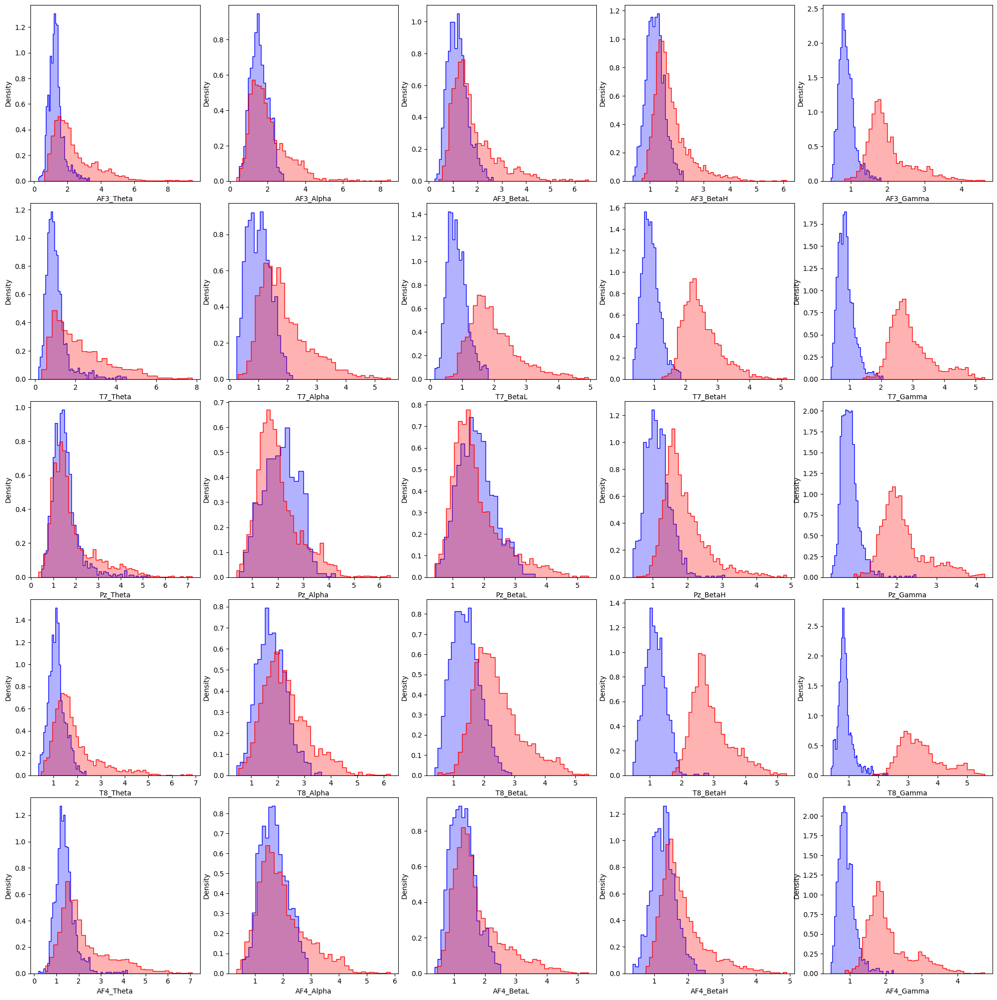

FILE  1


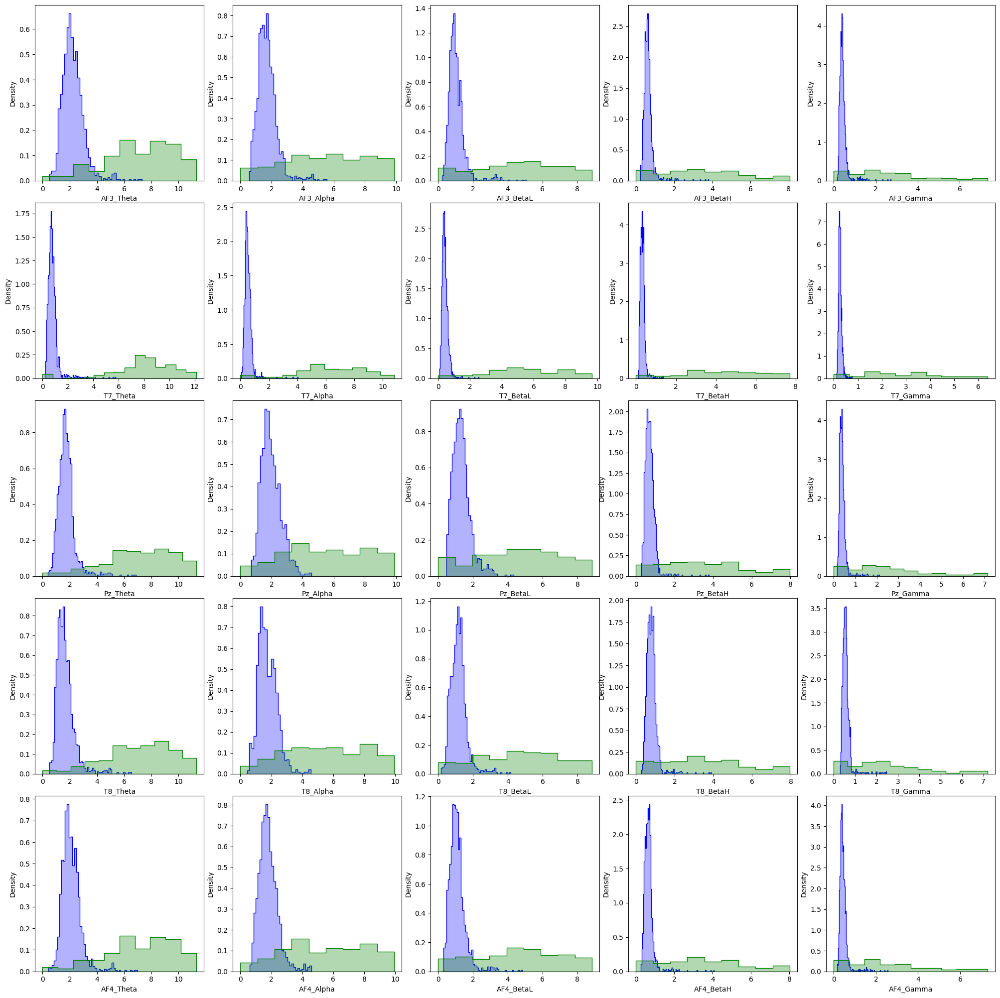

FILE  2


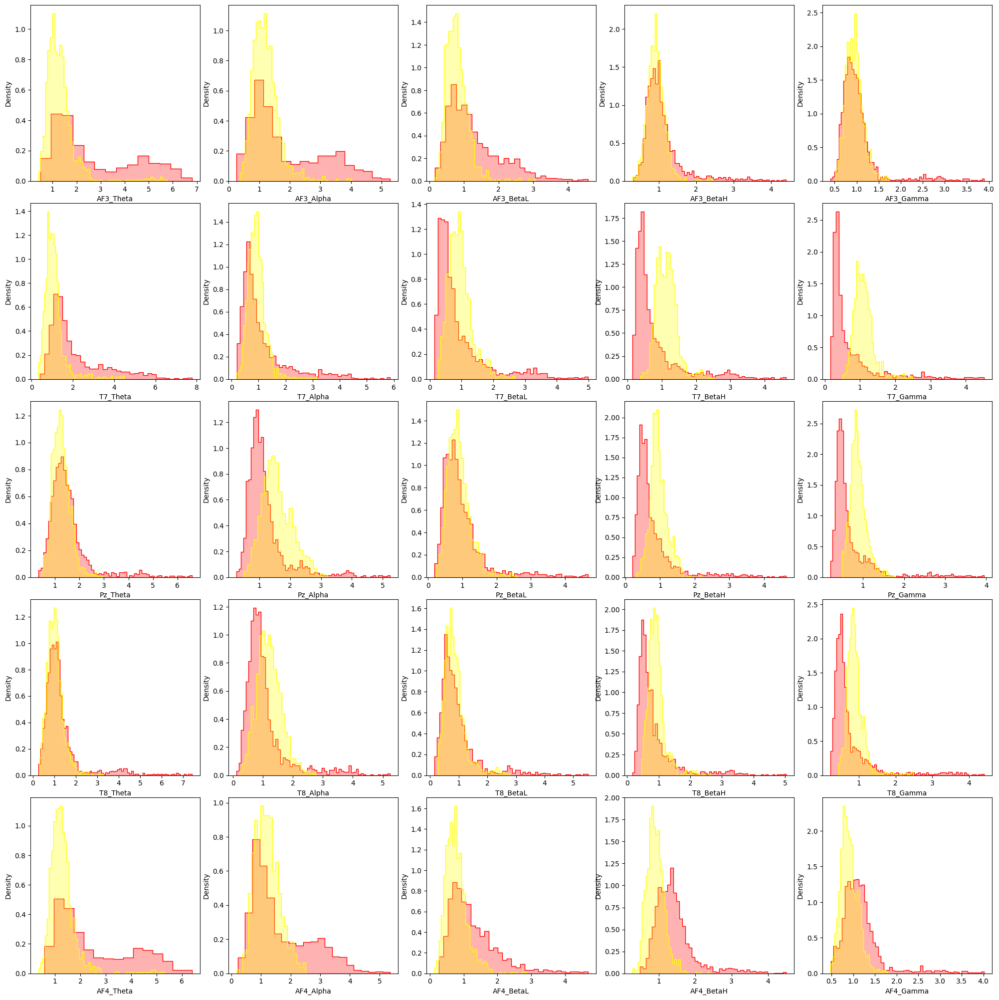

FILE  3


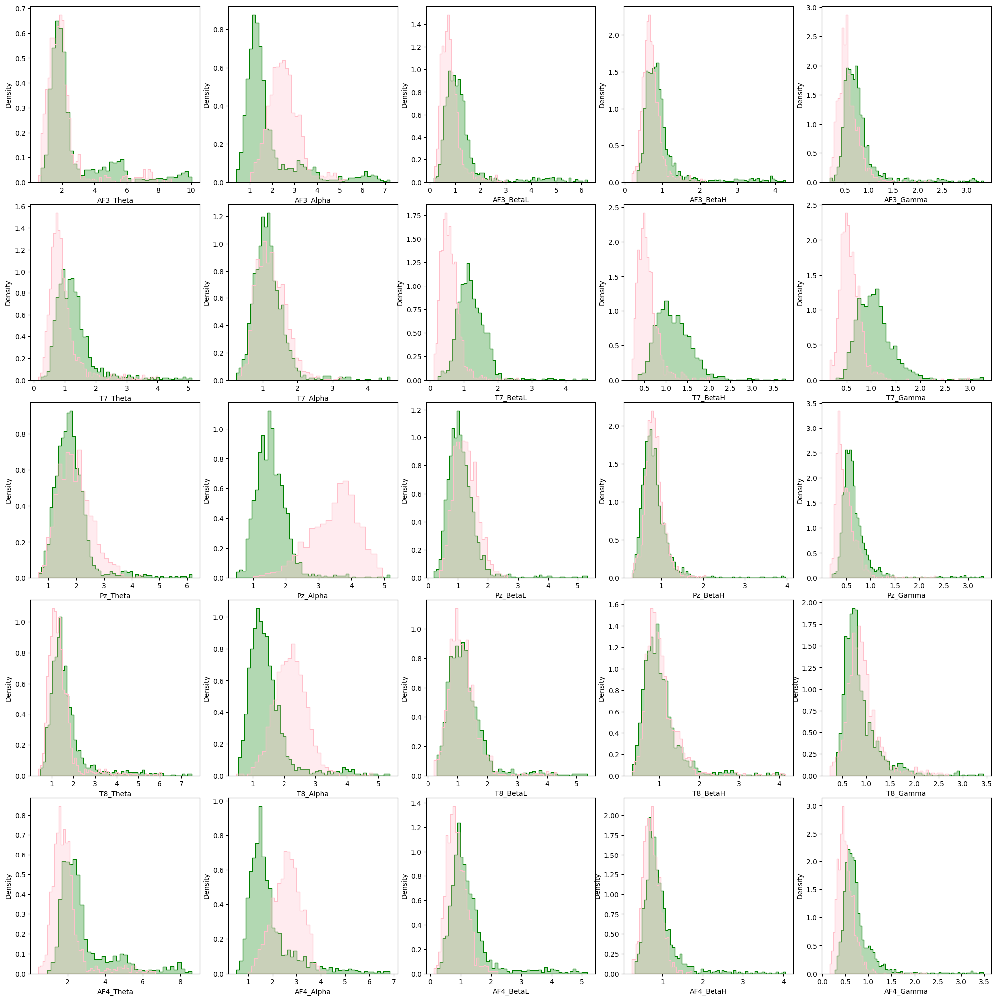

FILE  4


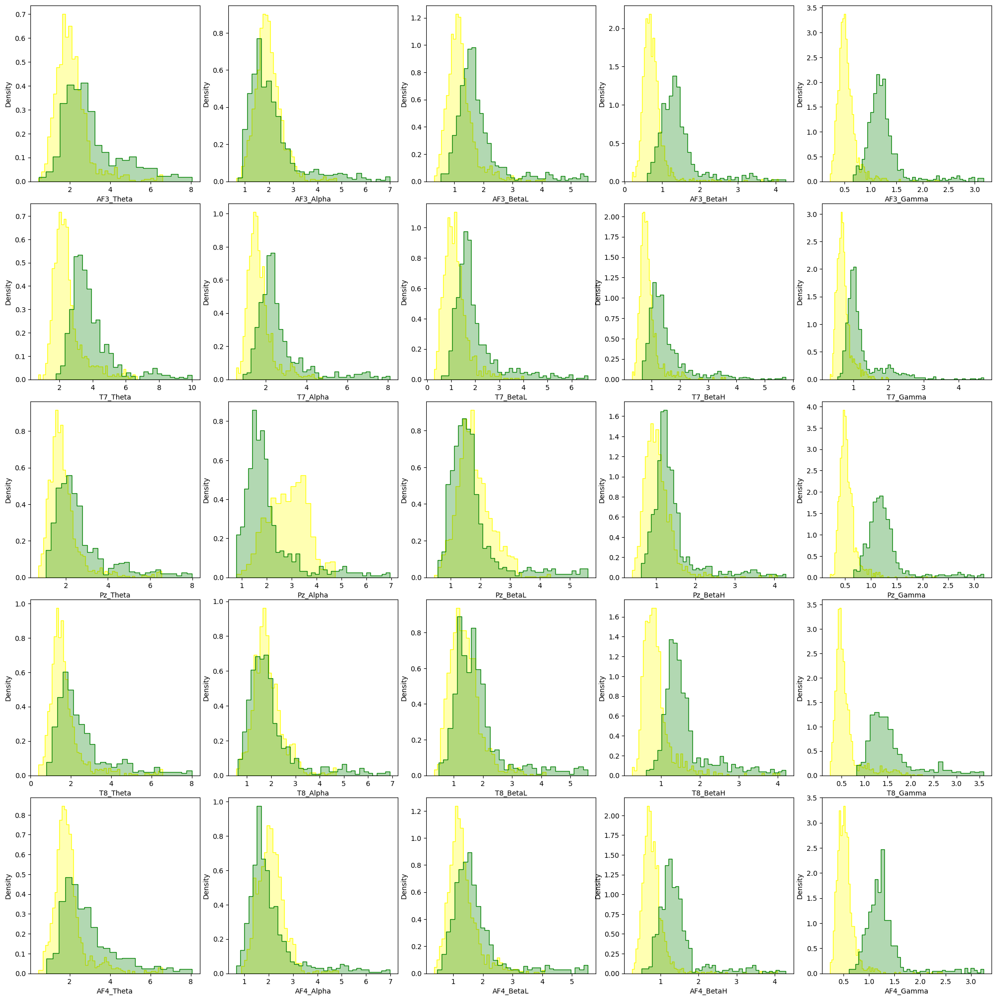

FILE  5


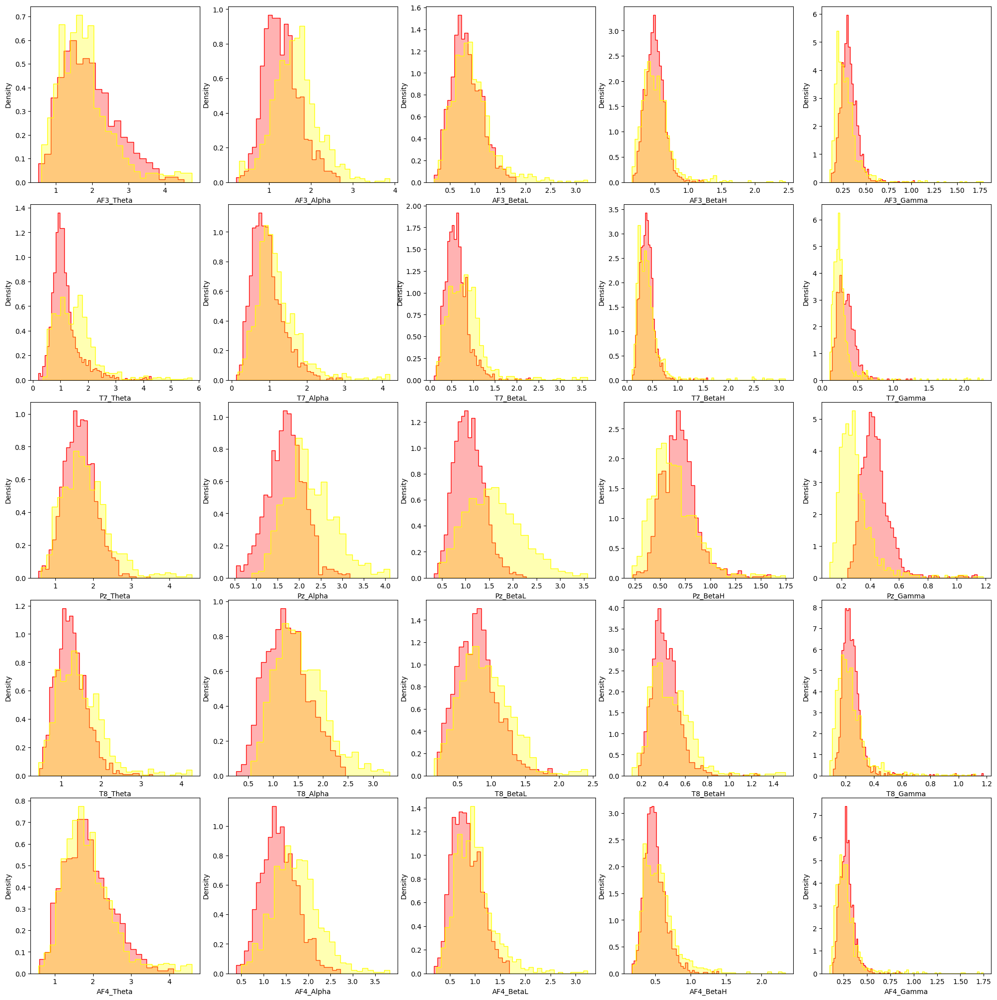

FILE  6


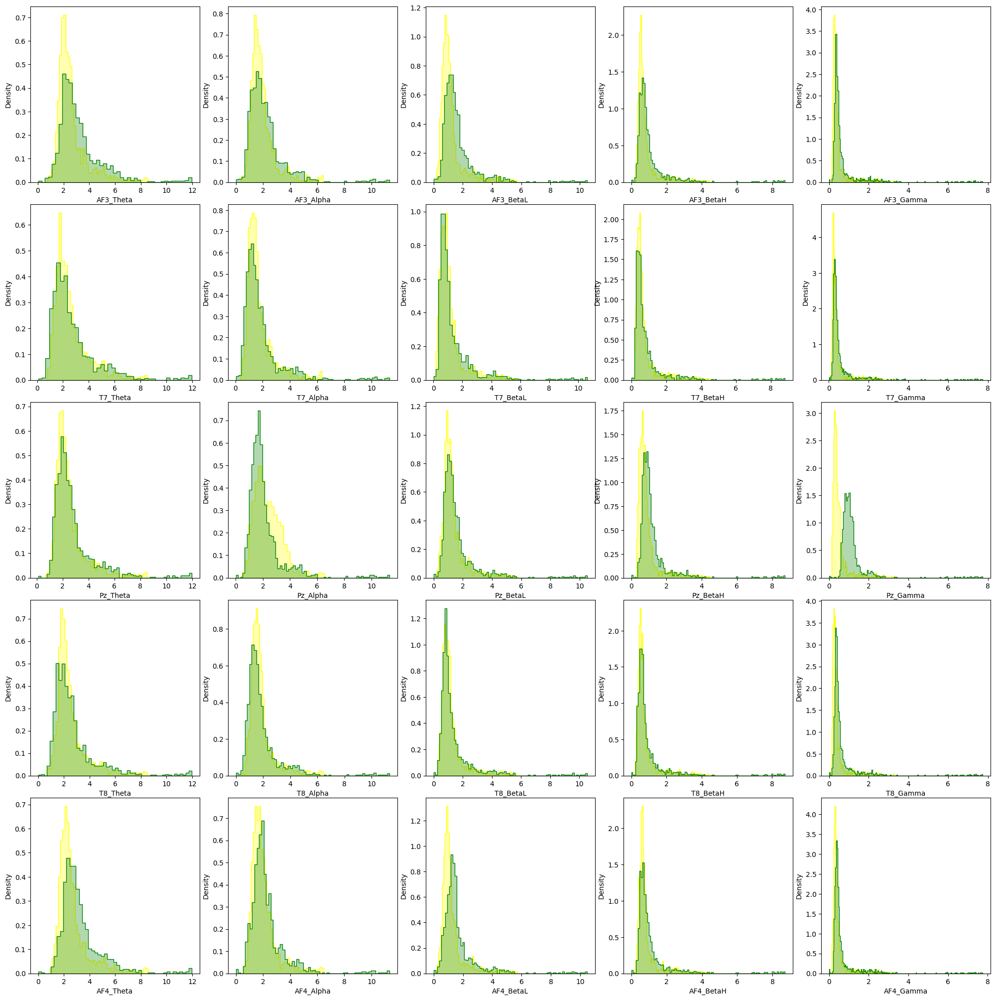

FILE  7


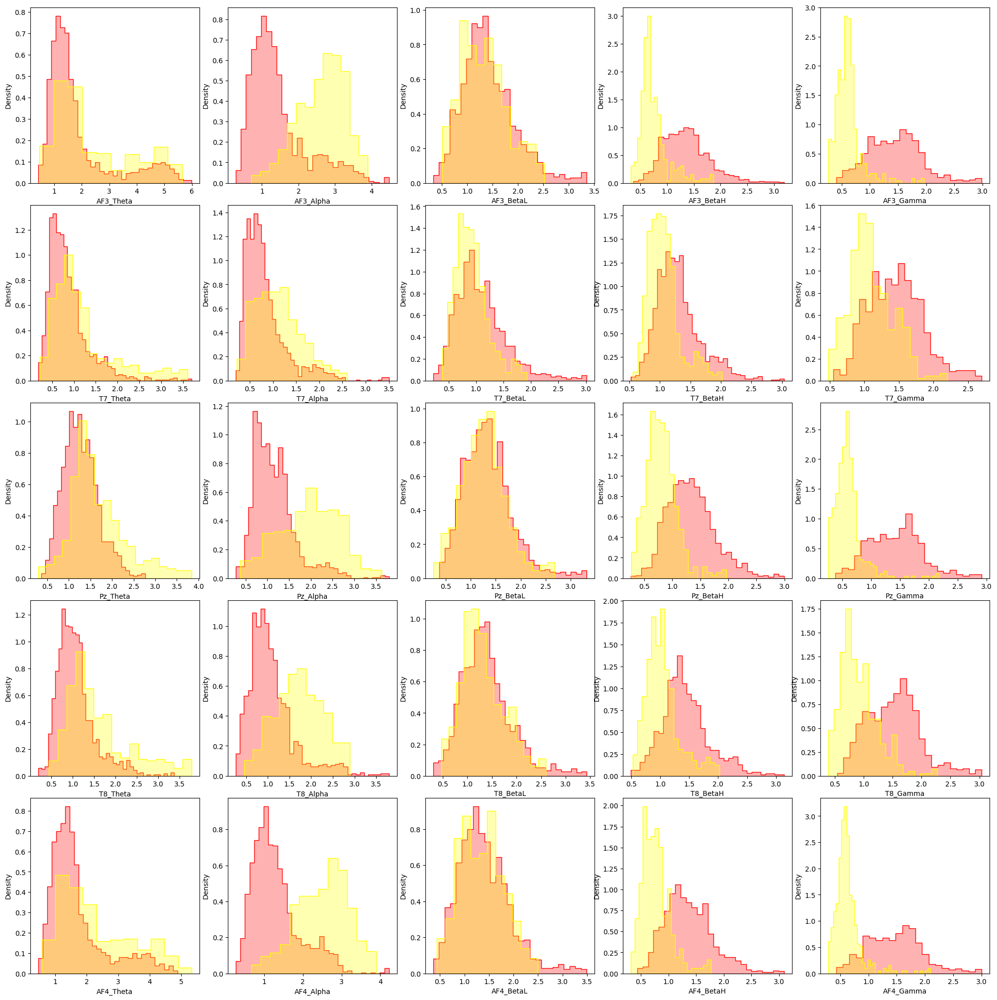

FILE  8


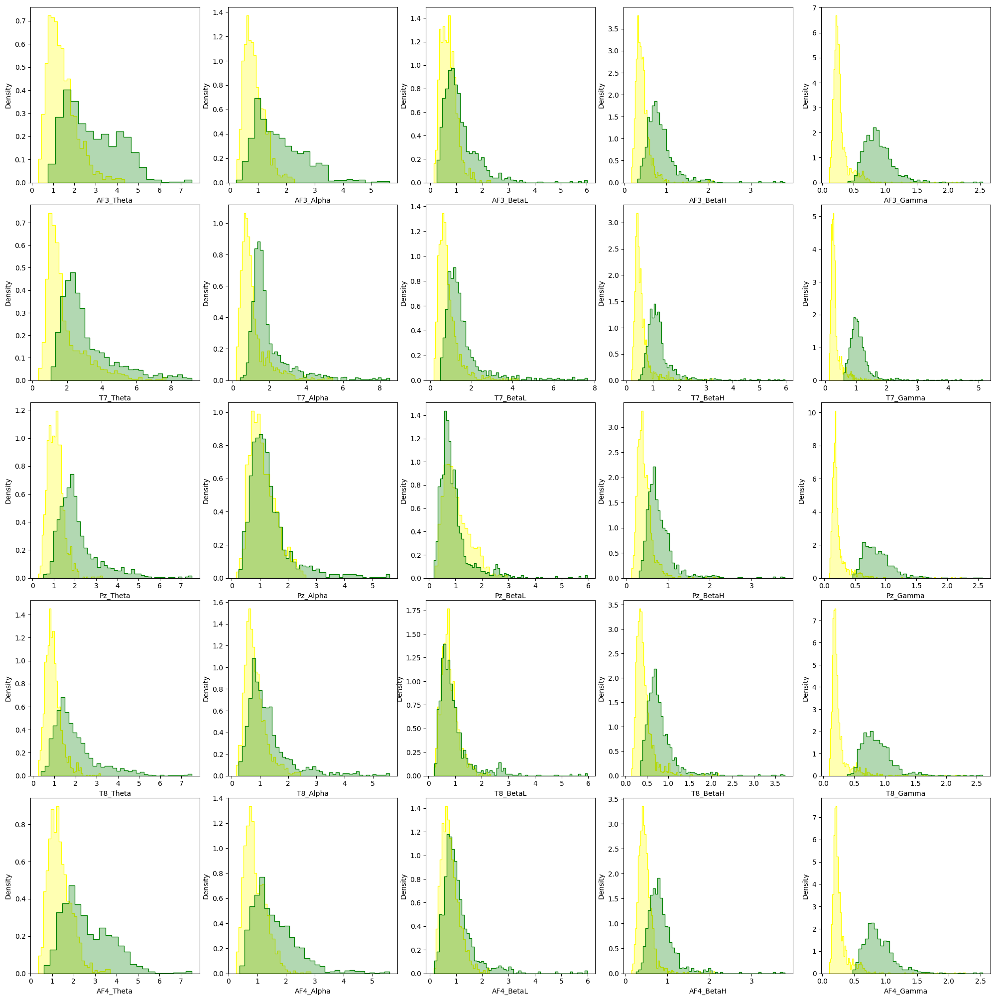

FILE  9


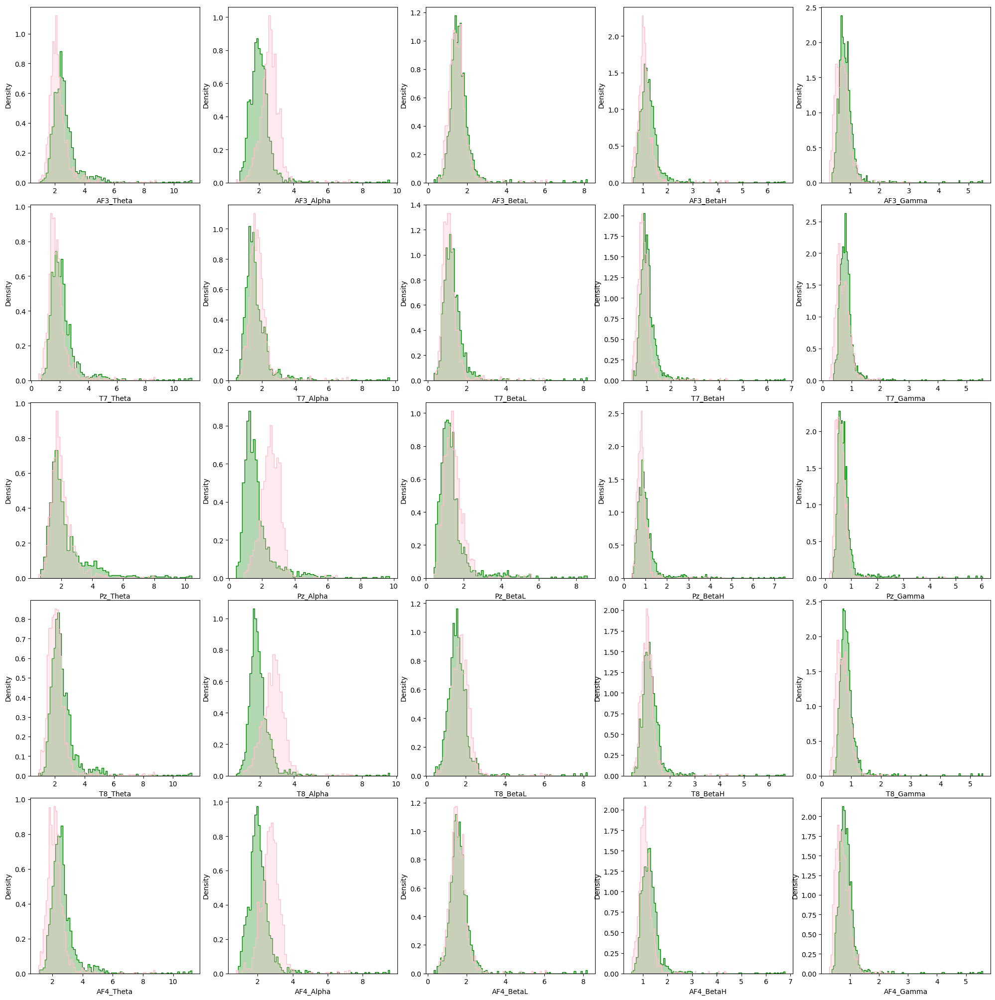

FILE  10


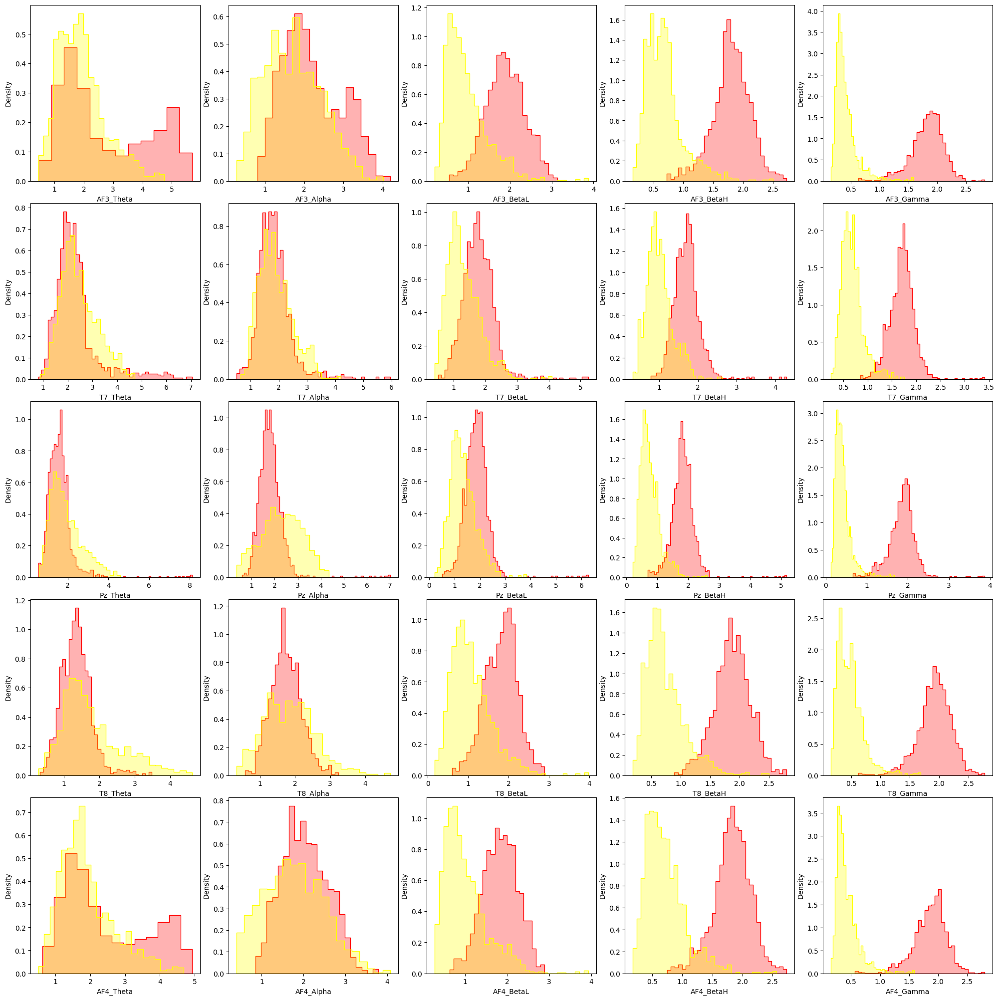

FILE  11


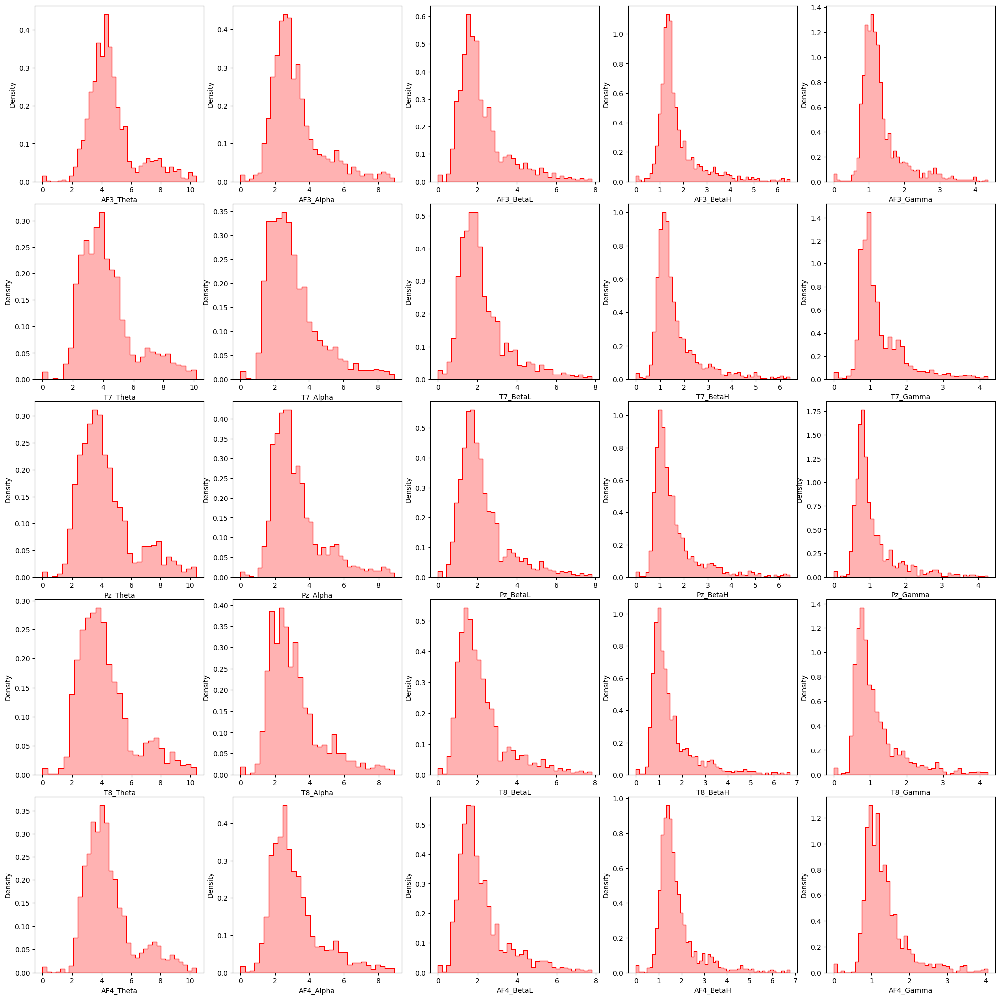

FILE  12


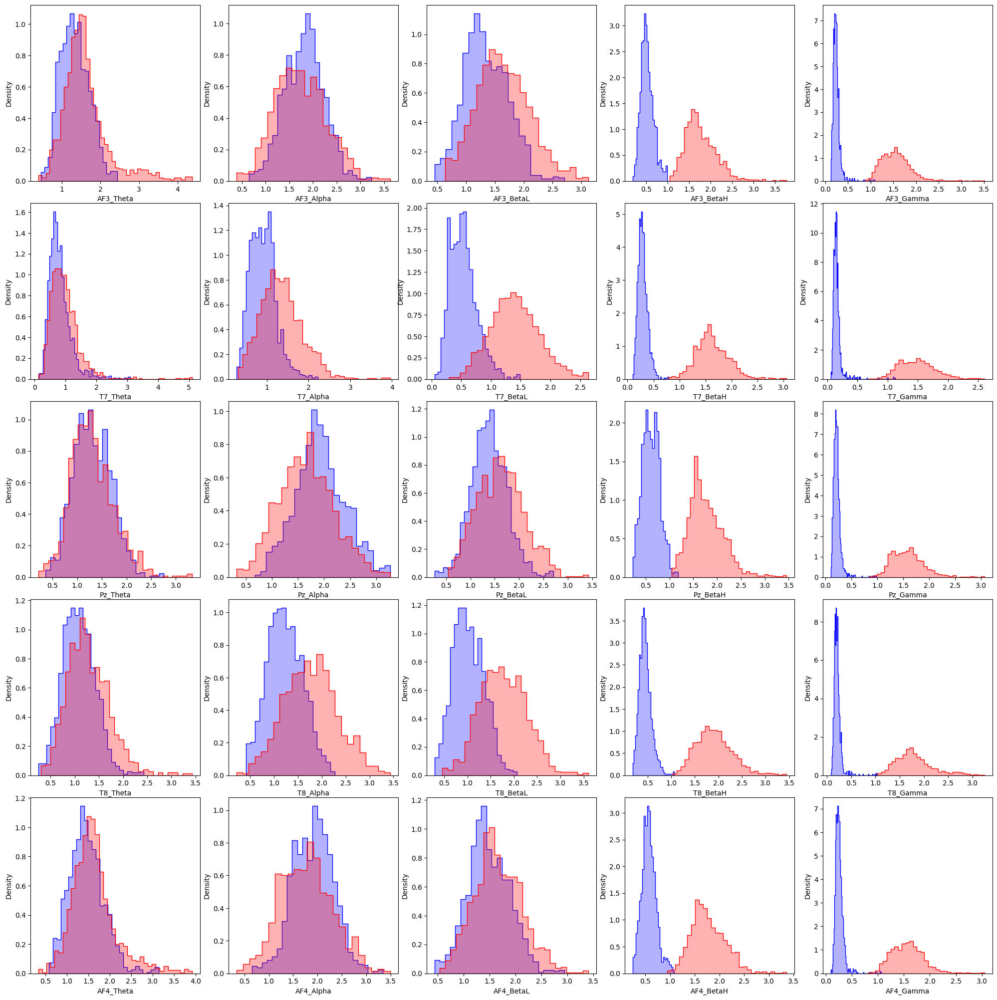

FILE  13


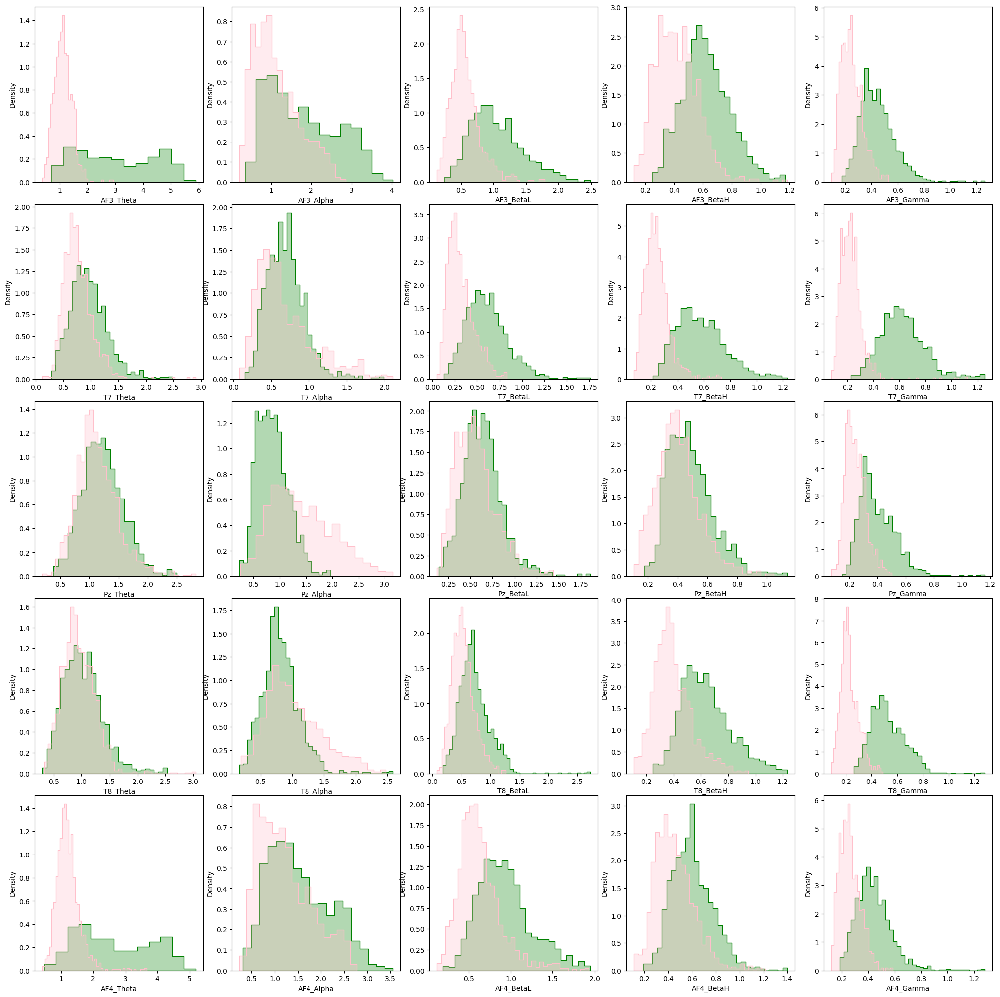

FILE  14


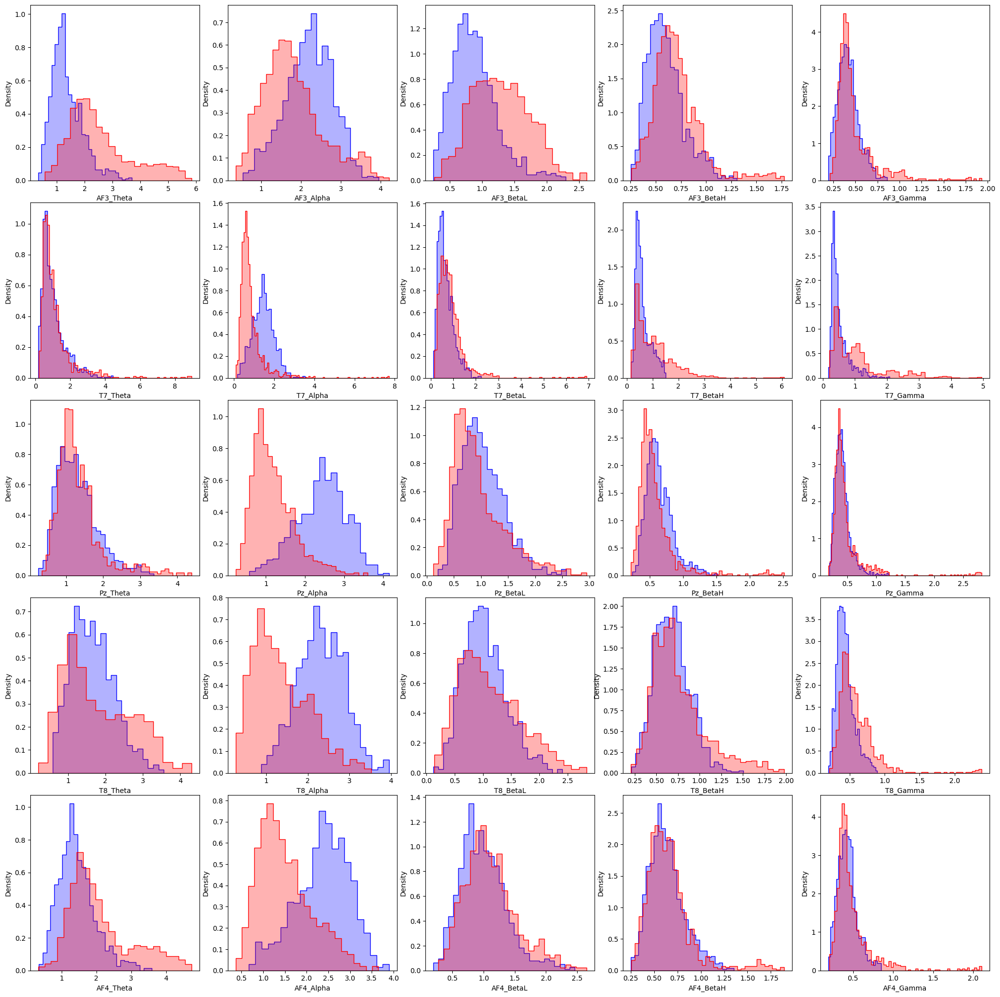

FILE  15


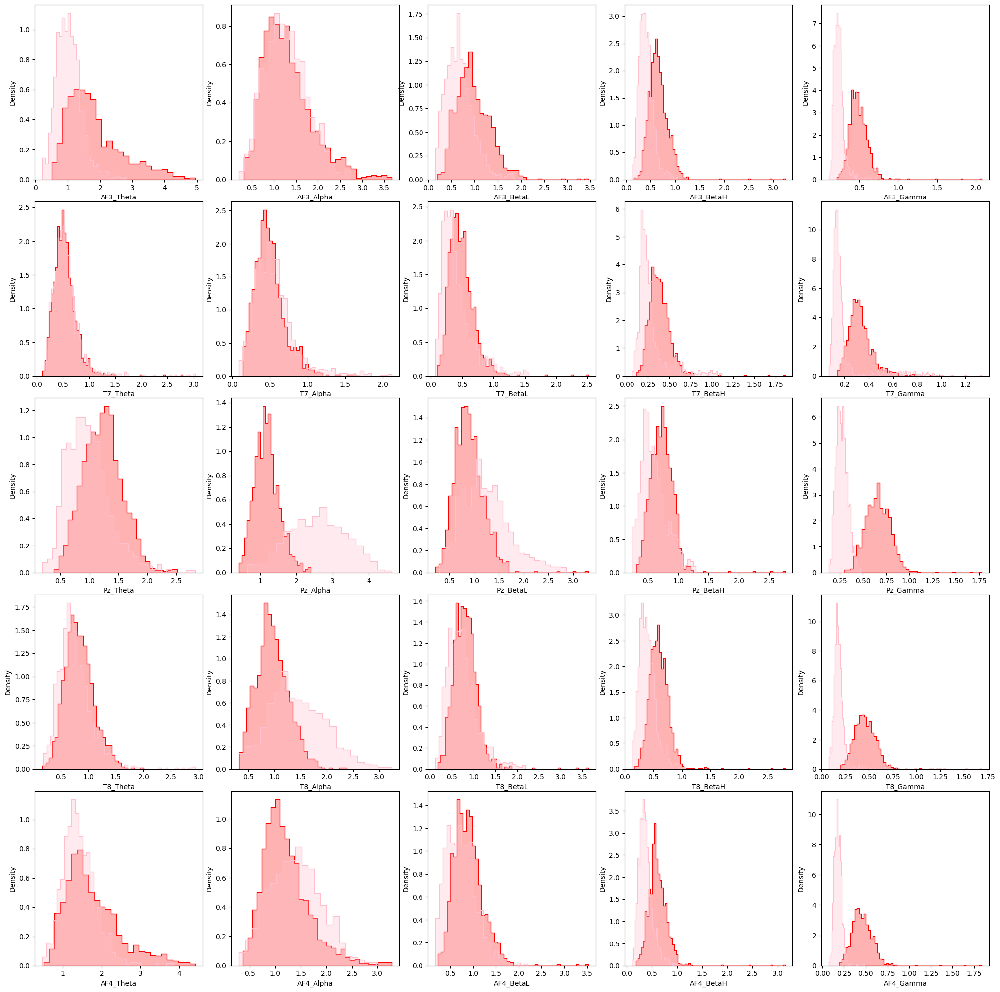

FILE  16


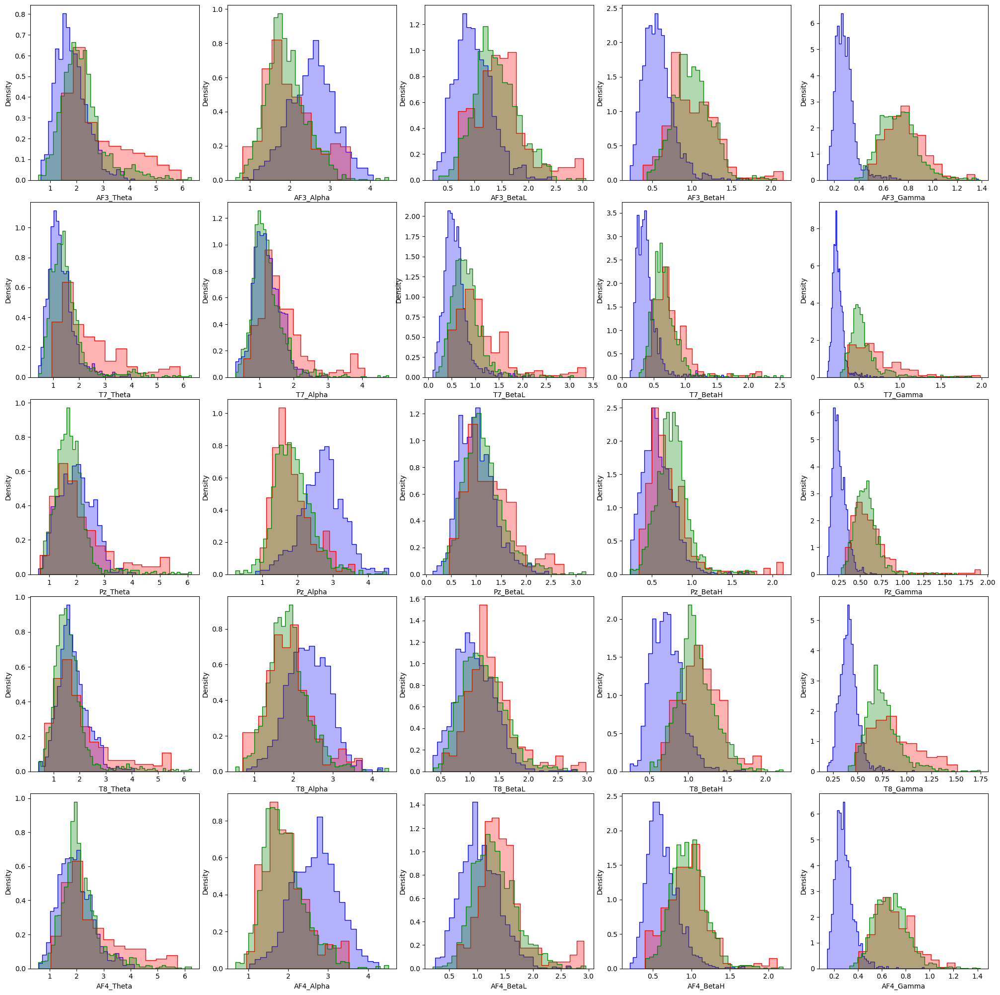

FILE  17


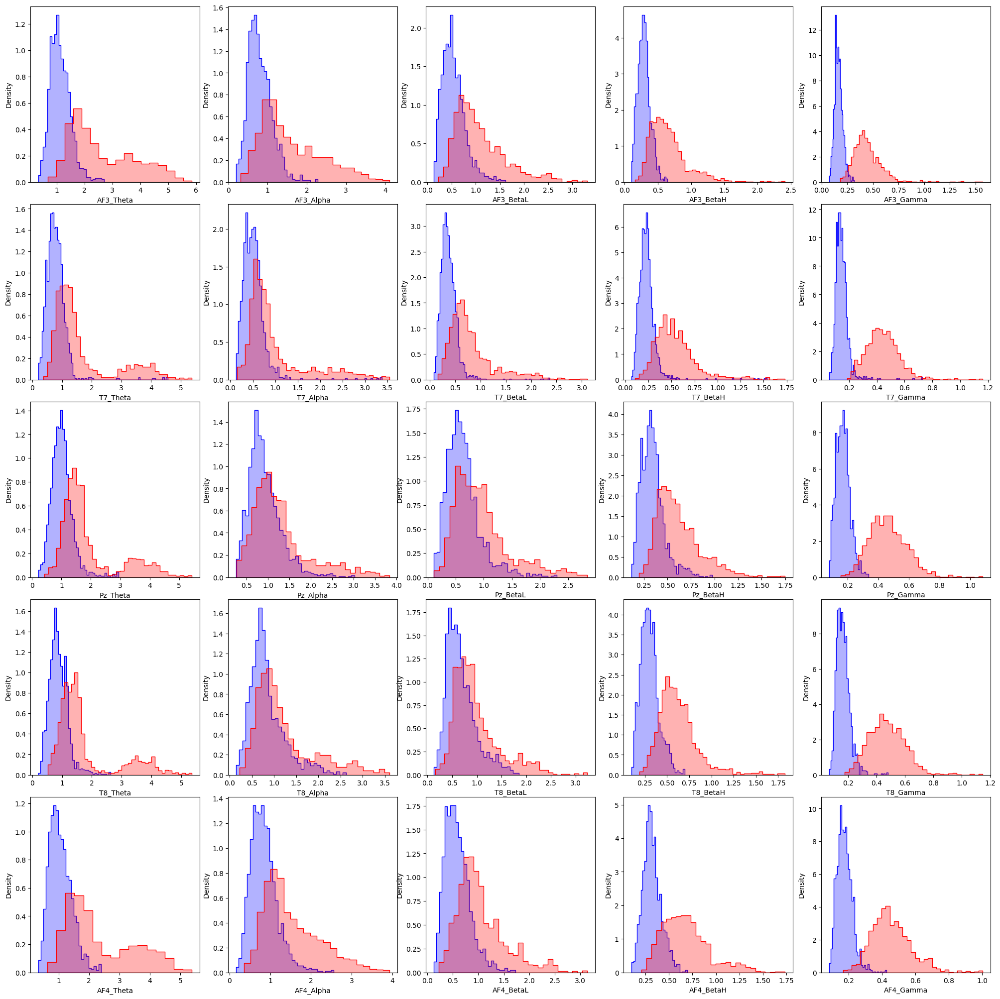

FILE  18


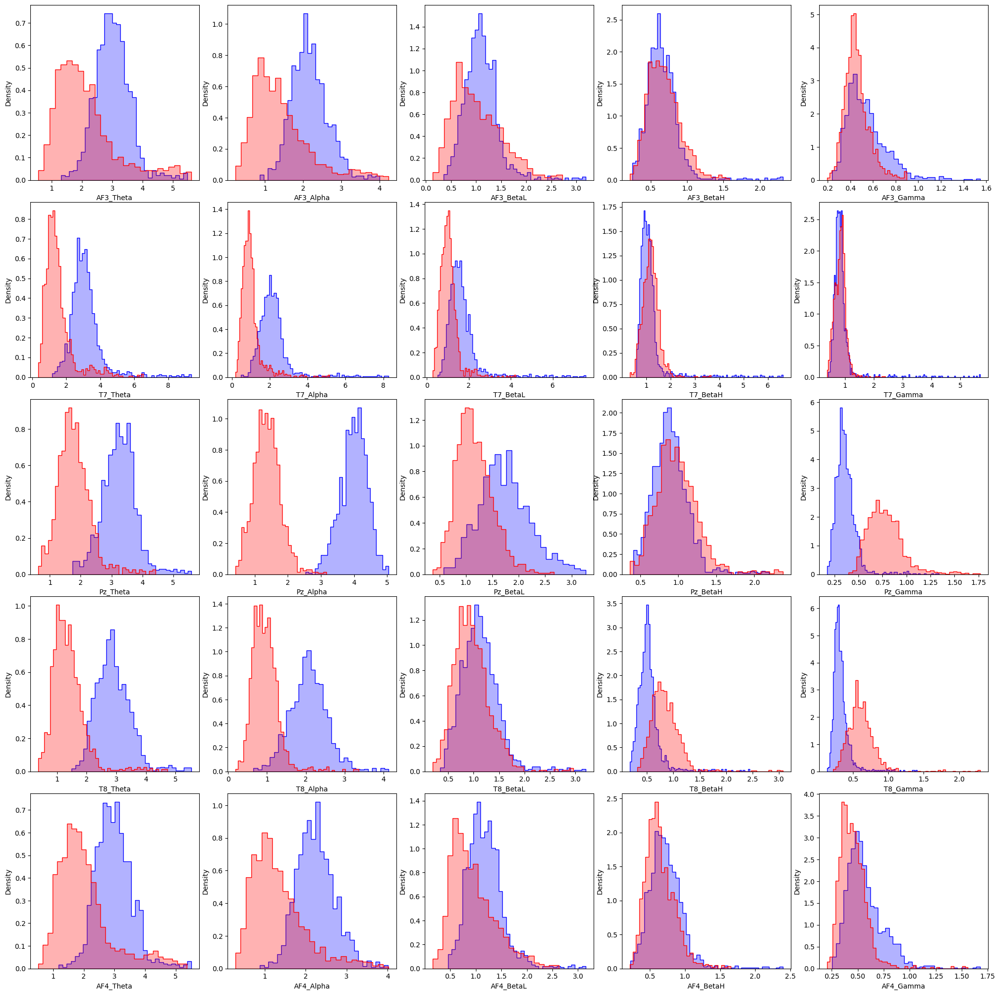

FILE  19


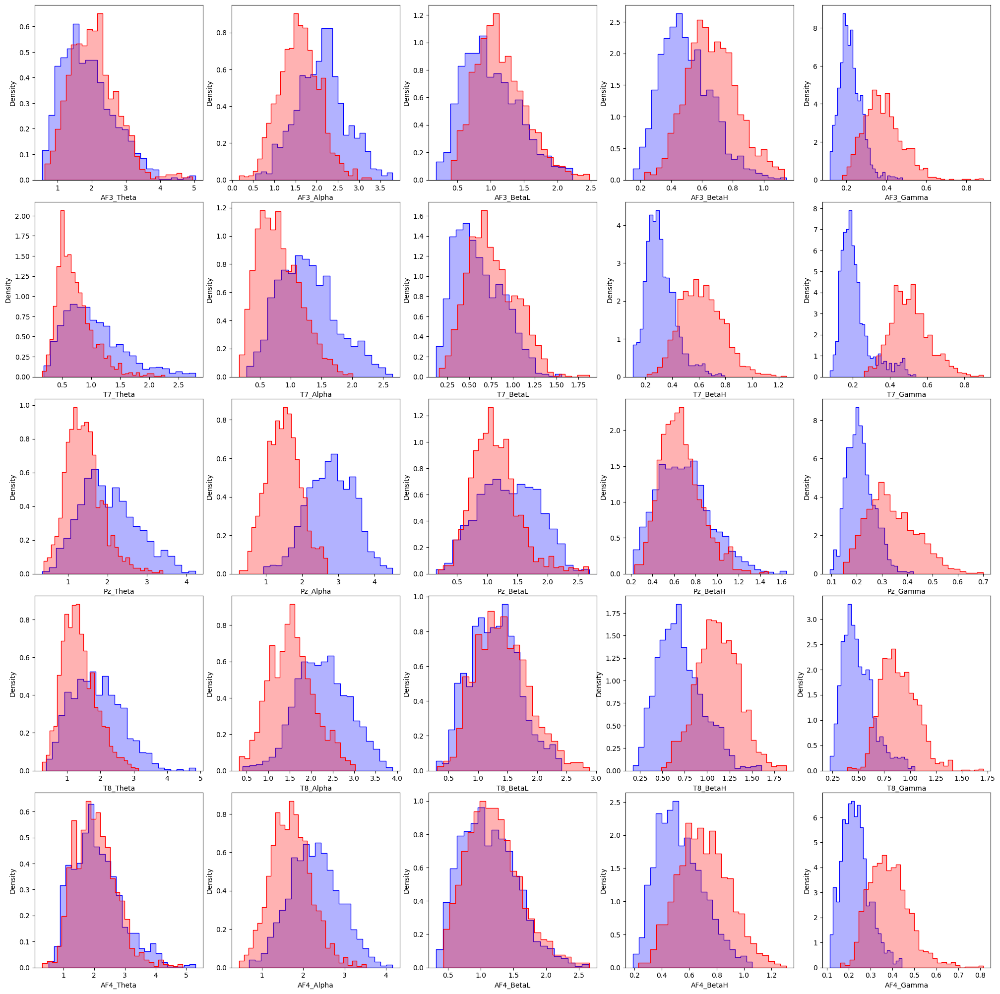

FILE  20


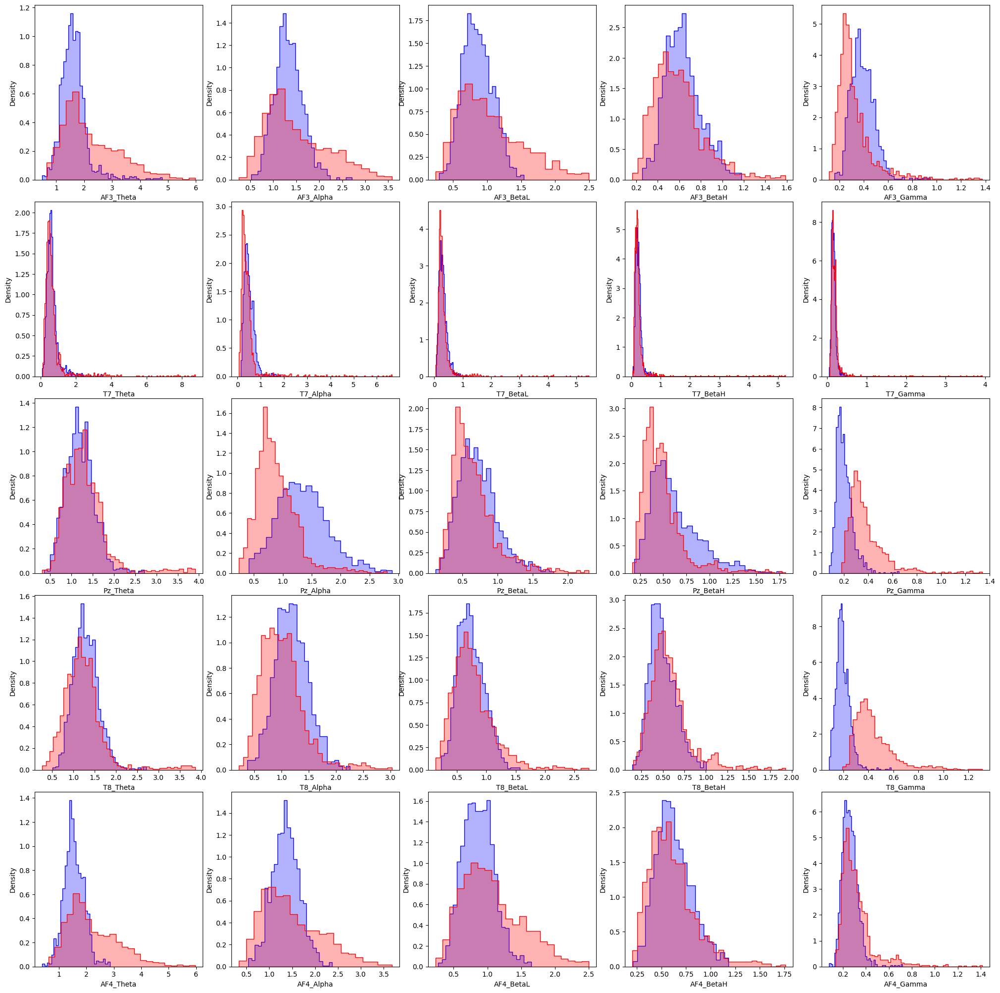

In [95]:
n = 0
for i, df in enumerate(transformed_list):
  data = dfs_list[i]
  X0 = df[data['Phase']=='baseline occhi chiusi']
  X1 = df[data['Phase']=='sudoku']
  X2 = df[data['Phase']=='Baseline occhi chiusi']
  X3 = df[data['Phase']=='Sudoku']
  X4 = df[data['Phase']=='occhi chiusi']

  fig, axes = plt.subplots(ncols=5, nrows=5, figsize=(20,20))
  fig.tight_layout()

  print("\033[1mFILE\033[0m ", f'{n}')
  for i, ax in zip(range(df.columns.size), axes.flat):
    sns.histplot(X0.iloc[:,i], color="blue", ax=ax, stat='density', element="step",  alpha=0.3)
    sns.histplot(X1.iloc[:,i], color="red",  ax=ax,stat='density', element="step",  alpha=0.3)
    sns.histplot(X2.iloc[:,i], color="yellow",  ax=ax,stat='density', element="step",  alpha=0.3)
    sns.histplot(X3.iloc[:,i], color="green",  ax=ax,stat='density', element="step",  alpha=0.3)
    sns.histplot(X4.iloc[:,i], color="pink",  ax=ax,stat='density', element="step",  alpha=0.3)

  n+=1

  plt.show()


---
# ***CLASSIFICATION***
---

In [96]:
# I need only data, not phase names
x = df_final
z = x.drop(columns = 'Phase')

# Conversion to numpy array
xnew = z.to_numpy()
# Let's check the shape
print(xnew.shape)

(60146, 25)


In [97]:
# Labels: I need a one-hot encoder. I realize the most basic (and stupid) one.
# I know there also the tfkl function "to_categorical()" but I gives me an error
# and now I don't have time to solve it
y = df_final['Phase']

labels = []
for i in y:
  if i == 'baseline occhi chiusi' or i == 'Baseline occhi chiusi' or i == 'occhi chiusi':
    labels.append(1)
  elif i == 'sudoku' or i == 'Sudoku':
    labels.append(0)

# conversion to array and shape check
labels = np.asarray(labels)
print("Original labels: ", labels.shape)

cat_labels = to_categorical(labels)
print("Categorical labels: ", cat_labels.shape)

Original labels:  (60146,)
Categorical labels:  (60146, 2)


In [98]:
# SPLIT DATA INTO TRAIN AND TEST SET
X_train, X_test, y_train, y_test = train_test_split(xnew, cat_labels,
                                                    test_size =0.20,
                                                    random_state= seed)   #fix random seed for replicability

print( X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(48116, 25) (12030, 25) (48116, 2) (12030, 2)


In [99]:
y_train_len = len(y_train)

train_labels = labels[:y_train_len]
print(len(train_labels))

48116


In [100]:
# CLASS BALANCING
weights = compute_class_weight('balanced', classes=[0, 1], y=train_labels)

# Creare un dizionario di pesi delle classi
weights_dict = {classe: peso for classe, peso in zip([0, 1], weights)}

# Stampa dei pesi delle classi
print("Classes weights:", weights_dict)

Classes weights: {0: 0.9179289557022396, 1: 1.098187793855845}


In [101]:
# my model
def CNN1D_classifier(input_shape, label):
    input_layer = tfkl.Input(shape=input_shape, name='Input')

    cnn = tfkl.Conv1D(512,3,padding='same',activation='relu', name = "prova")(input_layer)
    cnn = tfkl.MaxPooling1D()(cnn)
    cnn = tfkl.Conv1D(512,3,padding='same',activation='relu')(cnn)
    gap = tfkl.GlobalAveragePooling1D()(cnn)
    dropout = tfkl.Dropout(.3, seed=seed)(gap)

    classifier = tfkl.Dense(1024, activation='relu')(dropout)
    dropout2 = tfkl.Dropout(.3, seed=seed)(classifier)
    output_layer = tfkl.Dense(2, activation='softmax')(dropout2)

    # Connect input and output through the Model class
    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='model')

    opt = tf.keras.optimizers.Adam(
      learning_rate = 2e-4,
      beta_1=0.9,
      beta_2=0.999,
      epsilon=1e-08,
      amsgrad=False,
      name="Adam",
    )
    # Compile the model
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics='accuracy')

    # Return the model
    return model

model = CNN1D_classifier((25, 1), labels)

In [ ]:
# Train the model
history = model.fit(
    x = X_train,
    y = y_train,
    batch_size = 32,
    class_weight = weights_dict,
    epochs = 200,
    validation_data=(X_test, y_test)
).history

Epoch 1/200
1504/1504 [==============================] - 135s 90ms/step - loss: 0.4500 - accuracy: 0.8434 - val_loss: 0.3179 - val_accuracy: 0.8773
Epoch 2/200
1504/1504 [==============================] - 135s 90ms/step - loss: 0.3624 - accuracy: 0.8680 - val_loss: 0.2967 - val_accuracy: 0.8909
Epoch 3/200
1504/1504 [==============================] - 139s 93ms/step - loss: 0.3221 - accuracy: 0.8805 - val_loss: 0.2502 - val_accuracy: 0.9061
Epoch 4/200
1504/1504 [==============================] - 136s 90ms/step - loss: 0.2796 - accuracy: 0.8914 - val_loss: 0.2703 - val_accuracy: 0.8945
Epoch 5/200
1504/1504 [==============================] - 136s 90ms/step - loss: 0.2679 - accuracy: 0.8988 - val_loss: 0.2328 - val_accuracy: 0.9130
Epoch 6/200
1504/1504 [==============================] - 134s 89ms/step - loss: 0.2826 - accuracy: 0.8971 - val_loss: 0.3276 - val_accuracy: 0.9121
Epoch 7/200
1504/1504 [==============================] - 135s 90ms/step - loss: 0.3056 - accuracy: 0.9004 - val_

In [ ]:
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.legend(['train_accuracy', 'val_accuracy'])
plt.title('(a) Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['train_loss', 'val_loss'])
plt.title('(b) Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()